In [114]:
import numpy as np
import pandas as pd
import yfinance as yf
from ta.trend import MACD
import gym
from gym import spaces
import matplotlib.pyplot as plt
import mplfinance as mpf
import math

class StockTradingEnv(gym.Env):
    def __init__(self, ticker='TSLA', start='2022-01-01', end='2023-01-01'):
        self.data = yf.download(ticker, start=start, end=end).reset_index()
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4,))
        self.action_space = spaces.Discrete(3)
        self.max_steps = len(self.data) - 1
        self.macd = MACD(self.data['Close']).macd()
        # self.macd_signal = MACD(self.data['Close']).macd_signal()
        # self.macd_diff = MACD(self.data['Close']).macd_diff()
        self.obv = self.calculate_obv()
        self.reset()

    def reset(self):
        self.current_step = 0
        self.balance = 10000
        self.shares_owned = 0
        self.net_worth = self.balance
        self.max_net_worth = self.balance
        return self._next_observation()

    def _next_observation(self):
        obs = np.array([
            self.data['Close'][self.current_step],
            # self.data['Low'][self.current_step],
            self.data['Volume'][self.current_step],
            self.macd[self.current_step],
            # self.macd_signal[self.current_step],
            # self.macd_diff[self.current_step],
            self.obv[self.current_step]
        ])
        return obs

    def step(self, action):
        assert self.action_space.contains(action)
        
        prev_net_worth = self.net_worth
        print(f"Date: {self.data['Date'][self.current_step]}")
        if action == 0:  # Sell
            if self.shares_owned > 0:
                self.balance += self.data['Close'][self.current_step] * self.shares_owned
                self.shares_owned = 0
                print(f"Sell at {self.data['Close'][self.current_step]}")
        
        elif action == 2:  # Buy
            if self.balance >= self.data['Close'][self.current_step]:
                share_buy = math.floor(self.balance / self.data['Close'][self.current_step])
                self.shares_owned += share_buy
                self.balance -= self.data['Close'][self.current_step] * share_buy
                print(f"Buy at {self.data['Close'][self.current_step]} * {share_buy}")
                
        print(f"Balance {self.balance}")
        print(f"Share owend {self.shares_owned}")
        
        self.net_worth = self.balance + (self.shares_owned * self.data['Close'][self.current_step])
        self.max_net_worth = max(self.max_net_worth, self.net_worth)
        
        self.current_step += 1
        
        done = self.current_step > self.max_steps
        
        if not done:
            obs = self._next_observation()
        else:
            obs = np.zeros_like(self.observation_space.low)
        
        reward = self.net_worth - prev_net_worth
        return obs, reward, done, {}

    def calculate_obv(self):
        obv = [0] * len(self.data)
        for i in range(1, len(self.data)):
            if self.data['Close'][i] > self.data['Close'][i - 1]:
                obv[i] = obv[i - 1] + self.data['Volume'][i]
            elif self.data['Close'][i] < self.data['Close'][i - 1]:
                obv[i] = obv[i - 1] - self.data['Volume'][i]
            else:
                obv[i] = obv[i - 1]
        return np.array(obv)
    
def render(self):
        df = self.data.copy()
        df['Buy'] = np.nan
        df['Sell'] = np.nan
        
        for step, action in self.buy_sell_actions:
            if action == 'Buy':
                df.at[df.index[step], 'Buy'] = df['Close'][step]
            elif action == 'Sell':
                df.at[df.index[step], 'Sell'] = df['Close'][step]
        
        ap0 = [
            # mpf.make_addplot(df['MACD'], panel=1, color='g', title="MACD"),
            # mpf.make_addplot(df['MACD_Signal'], panel=1, color='r'),
            # mpf.make_addplot(df['MACD_Diff'], panel=1, color='b'),
            mpf.make_addplot(df['Buy'], type='scatter', marker='^', color='g', markersize=100, panel=0),
            mpf.make_addplot(df['Sell'], type='scatter', marker='v', color='r', markersize=100, panel=0)
        ]
        
        df
        
        mpf.plot(df, type='candle', style='charles', addplot=ap0, volume=True)

class QLearningAgent:
    def __init__(self, env, learning_rate=0.1, discount_factor=0.99, exploration_rate=1.0, exploration_decay_rate=0.995):
        self.env = env
        self.learning_rate = learning_rate
        self.discount_factor = discount_factor
        self.exploration_rate = exploration_rate
        self.exploration_decay_rate = exploration_decay_rate
        self.q_table = np.zeros((10, 10, 10, 10, env.action_space.n))

    def _discretize_state(self, state):
        state_bounds = [
            (self.env.data['Close'].min(), self.env.data['Close'].max()),
            (self.env.data['Volume'].min(), self.env.data['Volume'].max()),
            (np.nanmin(self.env.macd), np.nanmax(self.env.macd)),
            (self.env.obv.min(), self.env.obv.max())
        ]
        discrete_state = []
        state = np.nan_to_num(state)  # Replace NaNs with 0
        for i in range(len(state)):
            if state_bounds[i][0] == state_bounds[i][1]:
                discrete_state.append(0)
            else:
                scaled_value = (state[i] - state_bounds[i][0]) / (state_bounds[i][1] - state_bounds[i][0])
                discrete_value = int(np.clip(scaled_value * (self.q_table.shape[i] - 1), 0, self.q_table.shape[i] - 1))
                discrete_state.append(discrete_value)
        return tuple(discrete_state)

    def choose_action(self, state):
        discrete_state = self._discretize_state(state)
        if np.random.rand() < self.exploration_rate:
            return self.env.action_space.sample()
        else:
            return np.argmax(self.q_table[discrete_state])

    def update_q_table(self, state, action, reward, next_state):
        state_index = self._discretize_state(state)
        next_state_index = self._discretize_state(next_state)
        q_value = self.q_table[state_index][action]
        max_next_q_value = np.max(self.q_table[next_state_index])
        
        new_q_value = (1 - self.learning_rate) * q_value + self.learning_rate * (reward + self.discount_factor * max_next_q_value)
        self.q_table[state_index][action] = new_q_value

    def decay_exploration_rate(self):
        if self.exploration_rate > 0.01:
            self.exploration_rate *= self.exploration_decay_rate

def train_and_validate(ticker, start, end, num_episodes=365):
    env = StockTradingEnv(ticker=ticker, start=start, end=end)
    agent = QLearningAgent(env)

    episode_rewards = []
    for episode in range(num_episodes):
        state = env.reset()
        episode_reward = 0
        
        while True:
            action = agent.choose_action(state)
            next_state, reward, done, _ = env.step(action)
            agent.update_q_table(state, action, reward, next_state)
            state = next_state
            episode_reward += reward
            if done:
                break
        
        agent.decay_exploration_rate()
        episode_rewards.append(episode_reward)
        print(f"Episode {episode + 1}/{num_episodes}, Reward: {episode_reward}")

    final_net_worth = agent.env.net_worth
    initial_balance = 10000
    cumulative_return = (final_net_worth - initial_balance) / initial_balance * 100
    print(f"Final Net Worth: {final_net_worth}")
    print(f"Cumulative Return: {cumulative_return:.2f}%")

    plt.plot(episode_rewards)
    plt.xlabel('Episode')
    plt.ylabel('Reward')
    plt.title('Episode Rewards')
    plt.grid(True)
    plt.show()

    # env.render()

[*********************100%%**********************]  1 of 1 completed


Date: 2023-01-03 00:00:00
Balance 10000
Share owend 0
Date: 2023-01-04 00:00:00
Buy at 113.63999938964844 * 87
Balance 113.32005310058594
Share owend 87
Date: 2023-01-05 00:00:00
Balance 113.32005310058594
Share owend 87
Date: 2023-01-06 00:00:00
Balance 113.32005310058594
Share owend 87
Date: 2023-01-09 00:00:00
Balance 113.32005310058594
Share owend 87
Date: 2023-01-10 00:00:00
Balance 113.32005310058594
Share owend 87
Date: 2023-01-11 00:00:00
Balance 113.32005310058594
Share owend 87
Date: 2023-01-12 00:00:00
Sell at 123.55999755859375
Balance 10863.039840698242
Share owend 0
Date: 2023-01-13 00:00:00
Balance 10863.039840698242
Share owend 0
Date: 2023-01-17 00:00:00
Buy at 131.49000549316406 * 82
Balance 80.85939025878906
Share owend 82
Date: 2023-01-18 00:00:00
Balance 80.85939025878906
Share owend 82
Date: 2023-01-19 00:00:00
Balance 80.85939025878906
Share owend 82
Date: 2023-01-20 00:00:00
Balance 80.85939025878906
Share owend 82
Date: 2023-01-23 00:00:00
Balance 80.8593902587

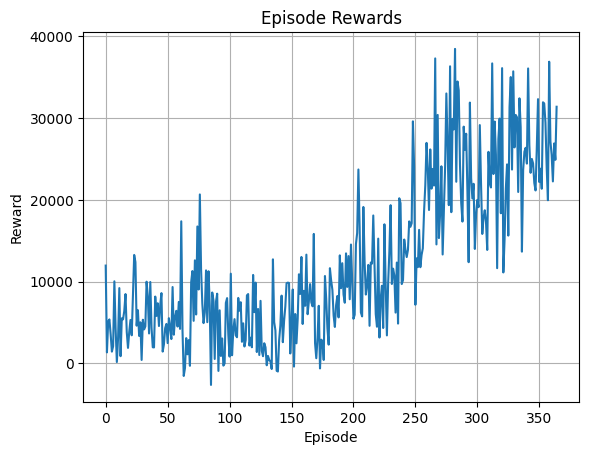

In [116]:
ticker = 'APPL'
start_date = '2023-01-01'
end_date = '2024-01-01'
train_and_validate(ticker, start_date, end_date, num_episodes=365)

[*********************100%%**********************]  1 of 1 completed


Date: 2023-01-03 00:00:00
Buy at 125.06999969482422 * 79
Balance 119.47002410888672
Share owend 79
Date: 2023-01-04 00:00:00
Sell at 126.36000061035156
Balance 10101.91007232666
Share owend 0
Date: 2023-01-05 00:00:00
Buy at 125.0199966430664 * 80
Balance 100.31034088134766
Share owend 80
Date: 2023-01-06 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-09 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-10 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-11 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-12 00:00:00
Sell at 133.41000366210938
Balance 10773.110633850098
Share owend 0
Date: 2023-01-13 00:00:00
Buy at 134.75999450683594 * 79
Balance 127.0710678100586
Share owend 79
Date: 2023-01-17 00:00:00
Sell at 135.94000244140625
Balance 10866.331260681152
Share owend 0
Date: 2023-01-18 00:00:00
Balance 10866.331260681152
Share owend 0
Date: 2023-01-19 00:00:00
Balance 10866.331260681152
Share owend 0
Date: 2023-01-20 0

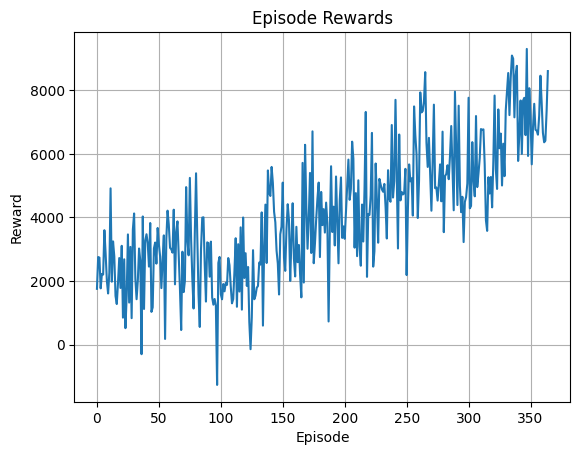

In [118]:
ticker = 'AAPL'
start_date = '2023-01-01'
end_date = '2024-01-01'
train_and_validate(ticker, start_date, end_date, num_episodes=365)